In [1]:
# Впишите путь к датасету с .dcm файлами
DCM_FOLDER_PATH = "./data"

In [2]:
import os
from typing import List


def find_dcm_files(root_folder: str) -> List[str]:
    # Рекурсивный поиск всех абсолютных путей файлов формата .dcm
    dcm_files = []
    for dirpath, _, filenames in os.walk(root_folder):
        for filename in filenames:
            if filename.lower().endswith(".dcm"):
                dcm_files.append(os.path.abspath(os.path.join(dirpath, filename)))
    return dcm_files


DCM_FILES_PATHS = find_dcm_files(DCM_FOLDER_PATH)

print(f"Найдено {len(DCM_FILES_PATHS)} фалов формата `.dcm` по пути `{DCM_FOLDER_PATH}`")

Найдено 288 фалов формата `.dcm` по пути `./data`


In [3]:
from pydicom import dcmread, FileDataset, DataElement, Dataset, Sequence
from pydicom.errors import InvalidDicomError
from traceback import print_exc
from typing import Dict
import pandas as pd


def __get_tags_from_element(element: FileDataset | Dataset | DataElement) -> Dict[str, str | None]:
    file_tags = dict()
    
    for elem in element:
        value = None
        key = elem.name
        if not elem.is_empty:
            value = elem.value
            if isinstance(value, bytes):
                continue
            elif isinstance(value, Sequence):
                for child in value:
                    child_result = __get_tags_from_element(child)
                    for child_key, child_value in child_result.items():
                        composite_key = " | ".join([key, child_key])
                        file_tags.update({composite_key: child_value})
            else:
                file_tags.update({key: value})
        else:
            file_tags.update({key: value})
    
    return file_tags


def get_tags_from_dcm_file(file_path: str) -> Dict[str, str | None]:
    # Получение всех тегов из файла формата .dcm
    file_tags = dict()
    
    try:
        with dcmread(file_path, stop_before_pixels=True) as fd:
            file_tags = __get_tags_from_element(fd)
    except InvalidDicomError:
        print(f"Ошибка чтения файла `{file_path}`")
        print_exc()

    return file_tags


DATA_FRAMES = []

for file_path in DCM_FILES_PATHS:
    result = get_tags_from_dcm_file(file_path)
    result_df = pd.DataFrame([result])
    DATA_FRAMES.append(result_df)


DATA_FRAME = pd.concat(DATA_FRAMES, ignore_index=True)

print(f"Количество обработанных файлов: {len(DATA_FRAME)}")

/tmp/ipykernel_527160/2975264196.py:54: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  DATA_FRAME = pd.concat(DATA_FRAMES, ignore_index=True)


Количество обработанных файлов: 288


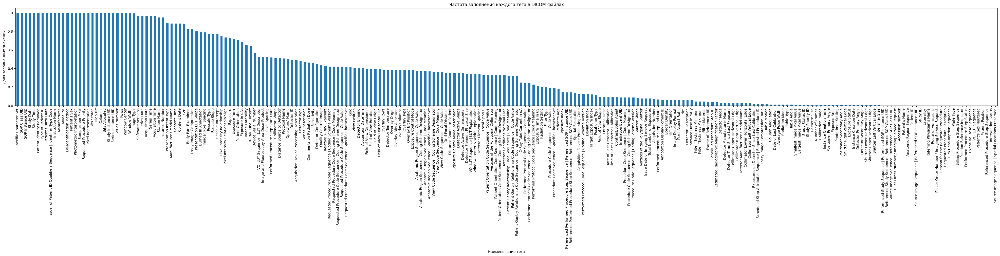

In [ ]:
import matplotlib.pyplot as plt

# Расчёт частоты заполнения тегов (непустых значений)
tag_fill_counts = DATA_FRAME.notnull().sum(axis=0)
tag_fill_freq = tag_fill_counts / len(DATA_FRAME)

# Построение графика частоты заполнения каждого тега
plt.figure(figsize=(50, 5))
tag_fill_freq.sort_values(ascending=False).plot(kind='bar')
plt.title('Частота заполнения каждого тега в DICOM-файлах')
plt.xlabel('Наименование тега')
plt.xticks(rotation=90, ha='center', fontsize=10)
plt.ylabel('Доля заполненных значений')
plt.show()

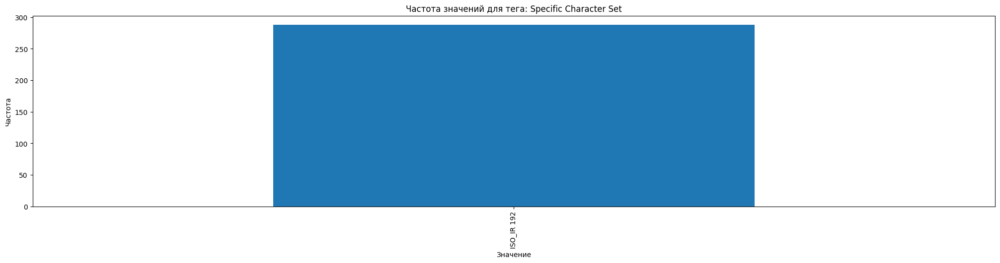

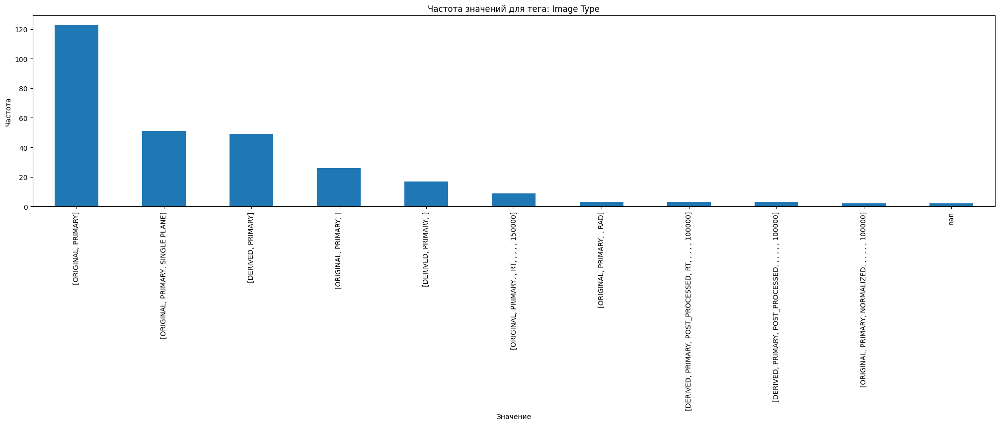

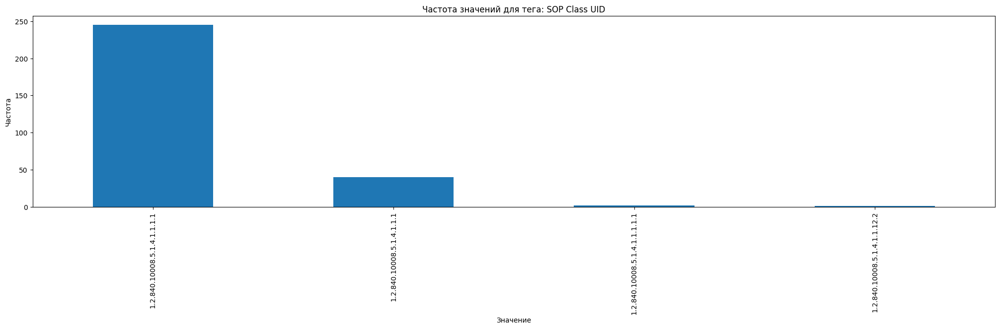

Тег `SOP Instance UID`: каждое значение уникально, график не строится.


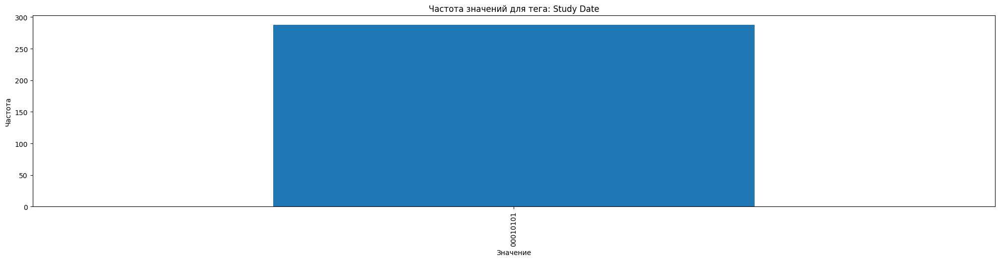

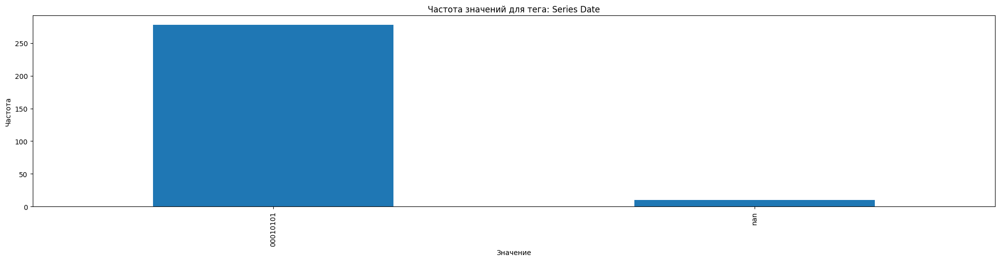

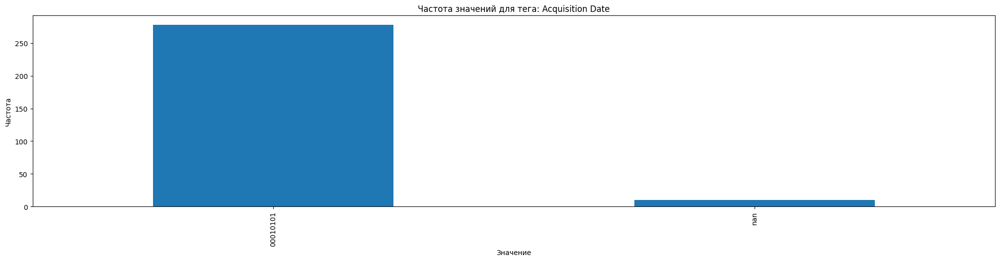

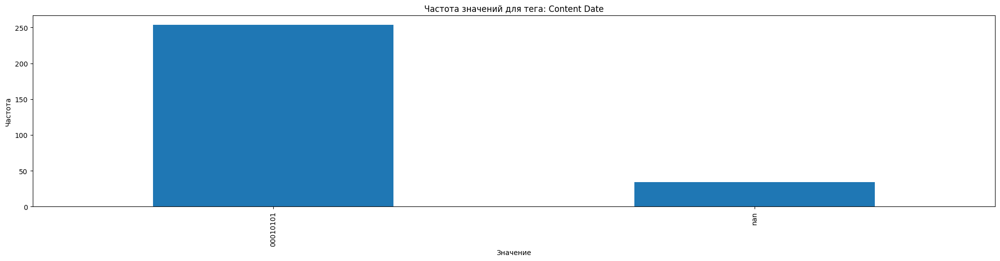

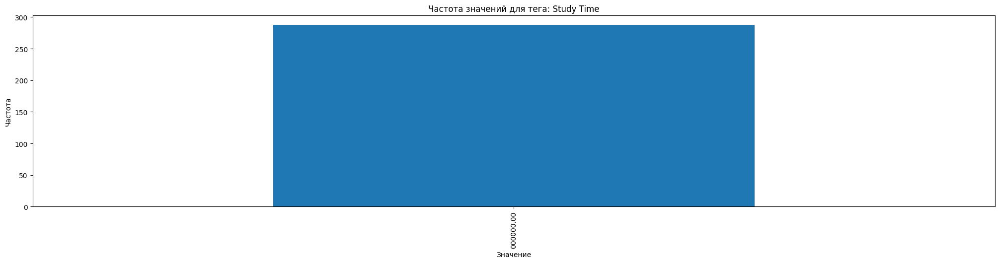

...

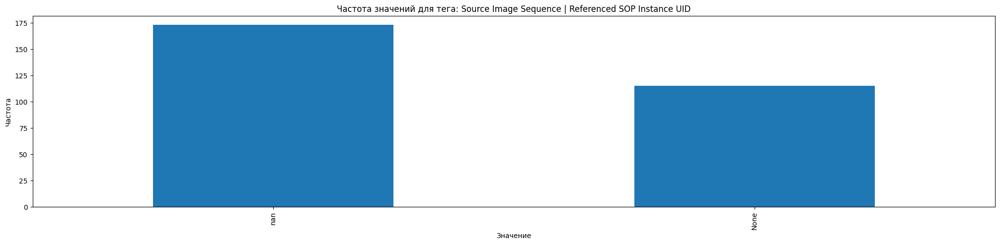

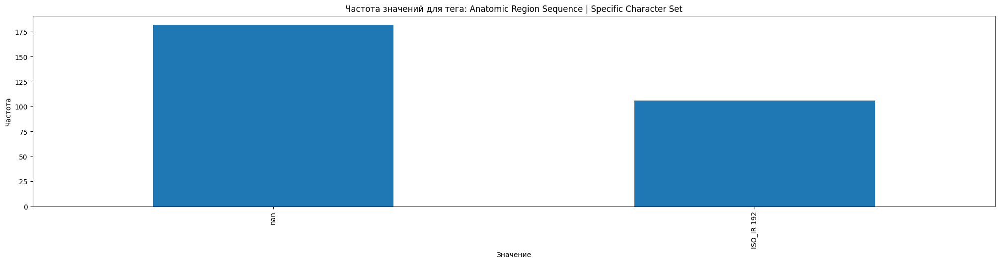

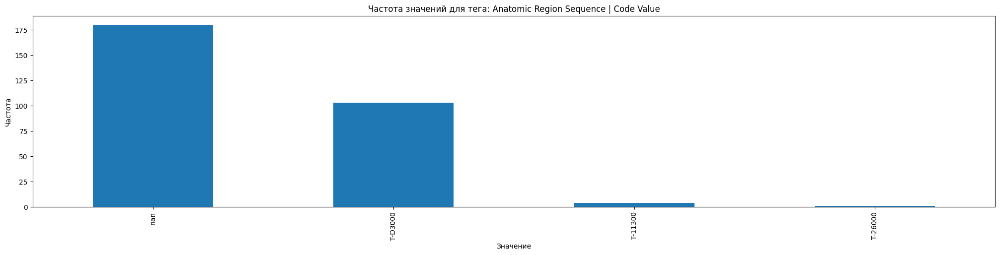

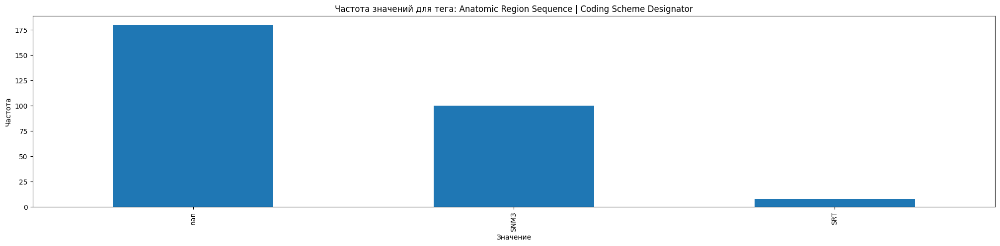

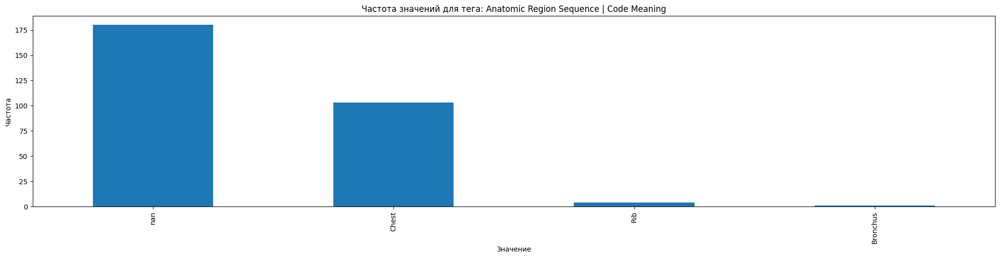

/home/f8ner/gakiknadze/mos_med_data_gap_analyzer/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 26 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


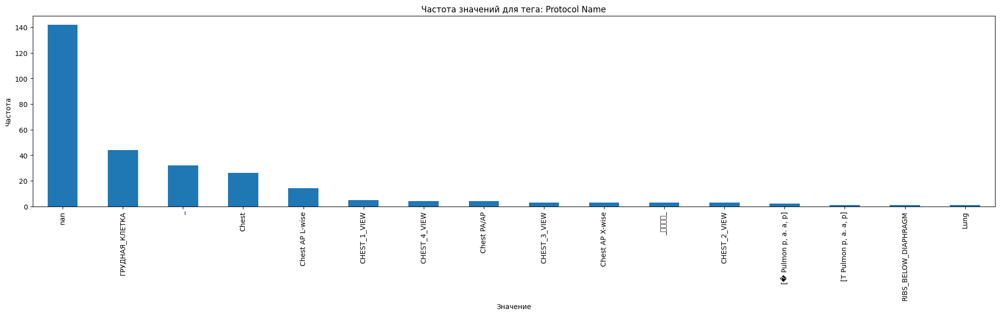

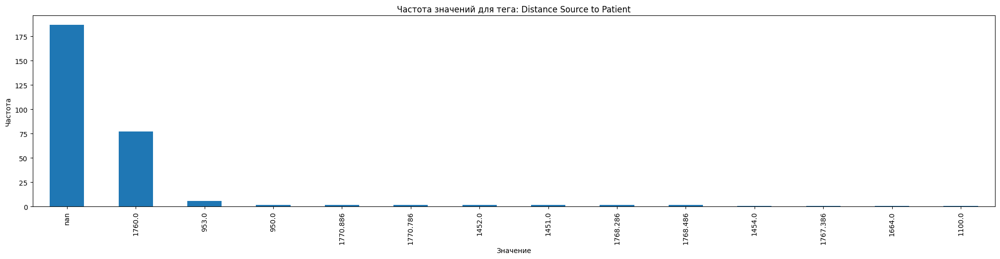

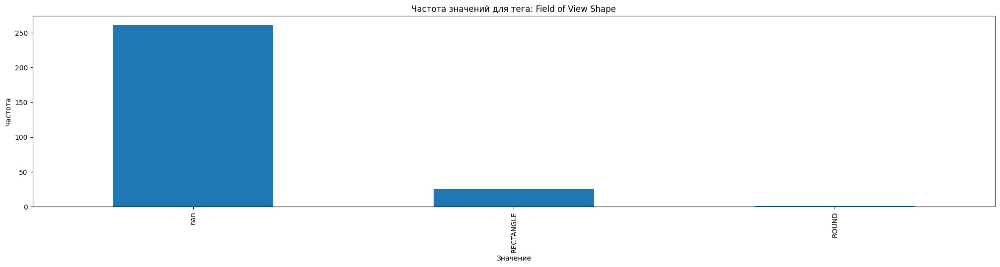

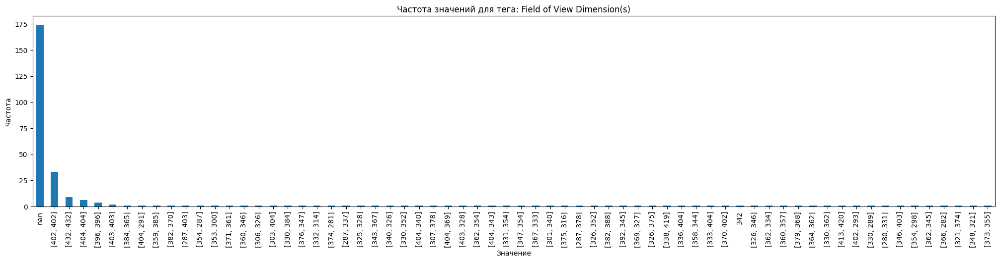

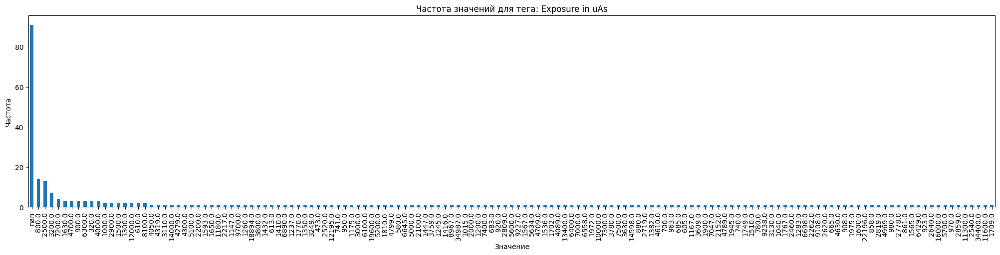

...

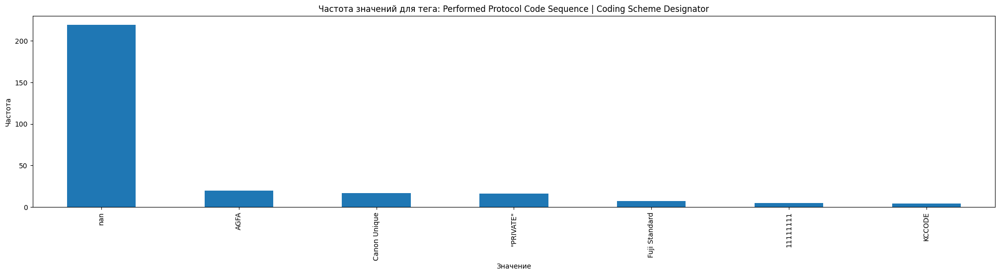

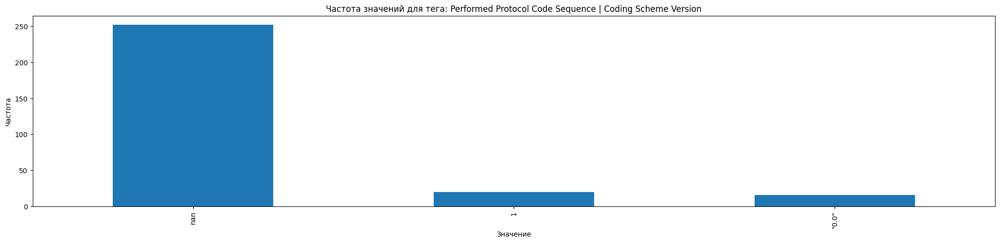

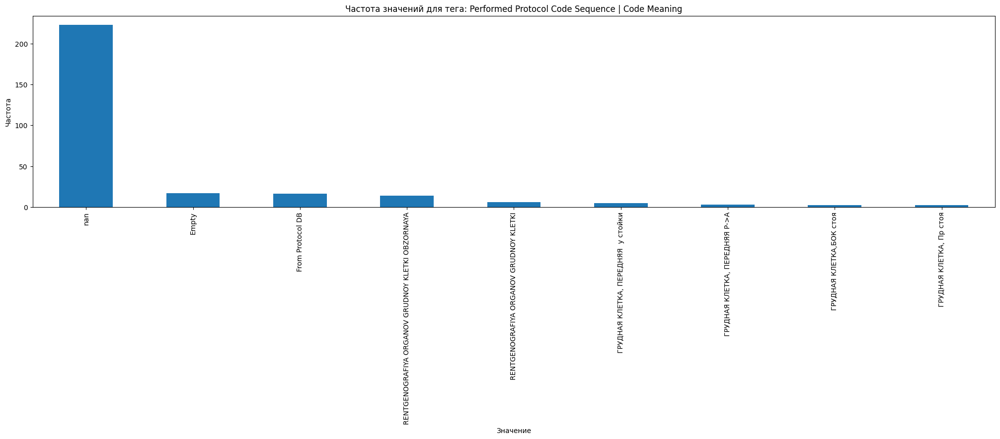

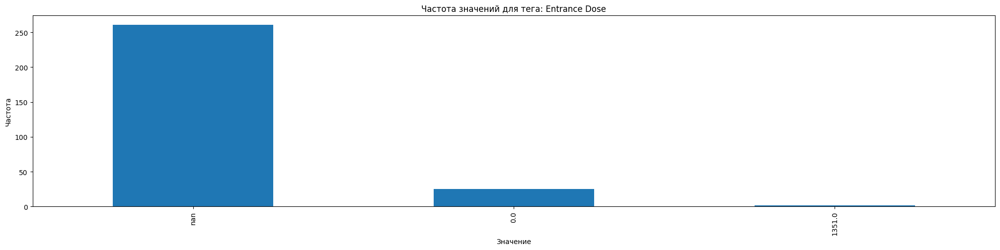

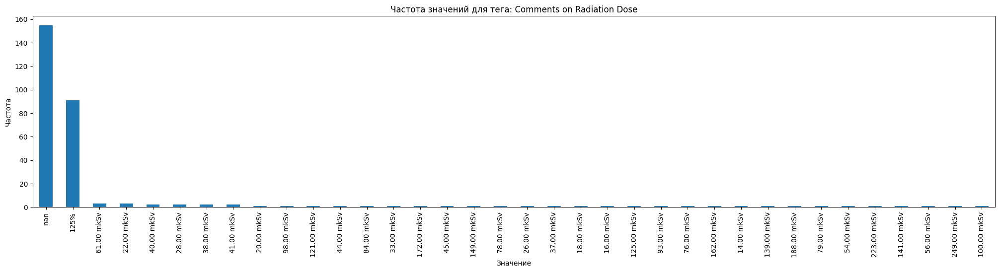

Тег `Entrance Dose in mGy`: каждое значение уникально, график не строится.


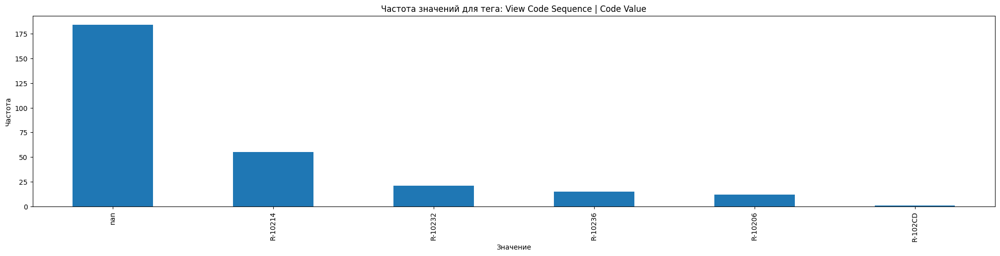

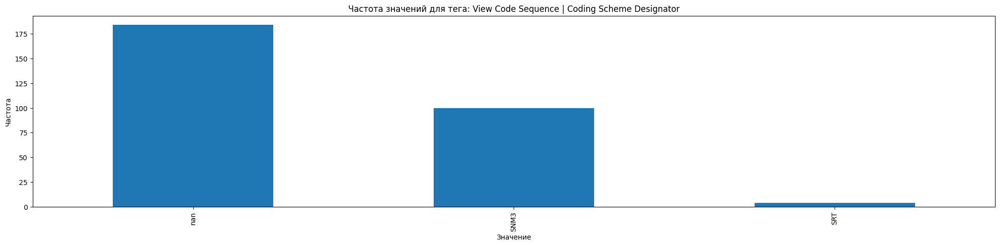

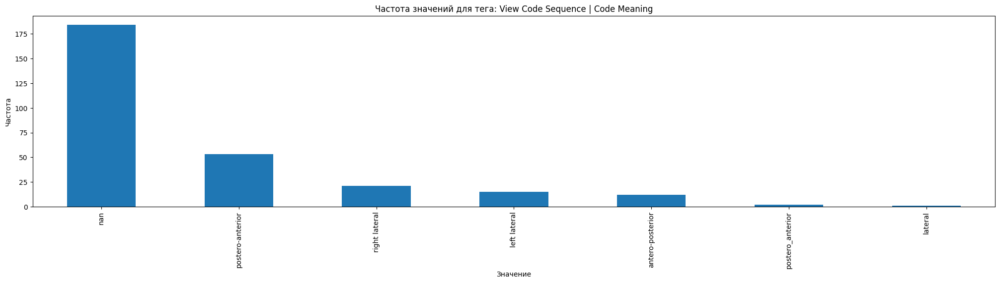

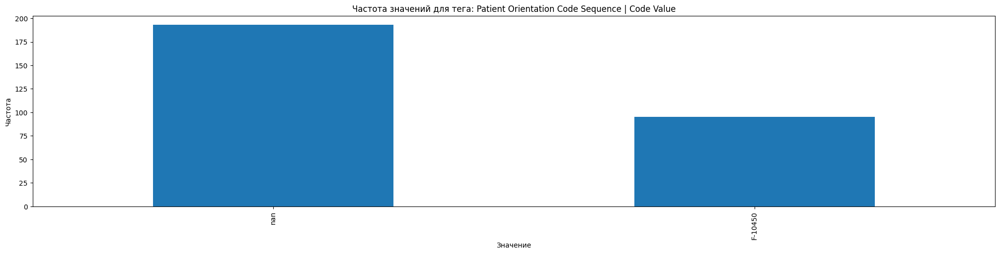

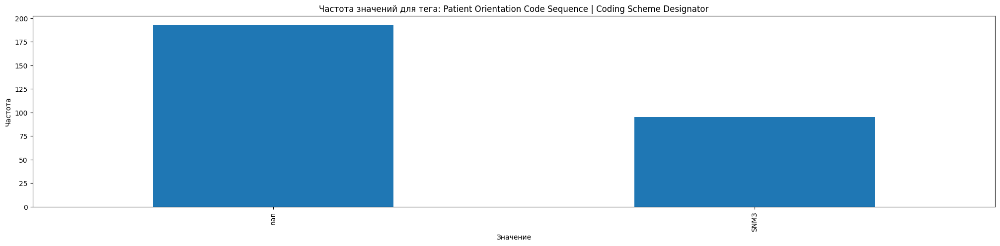

...

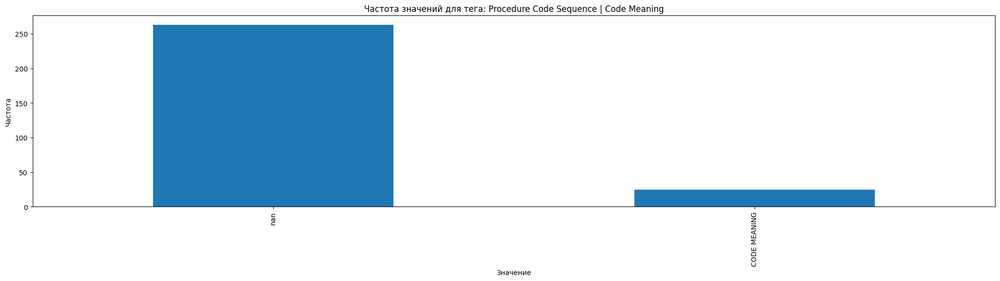

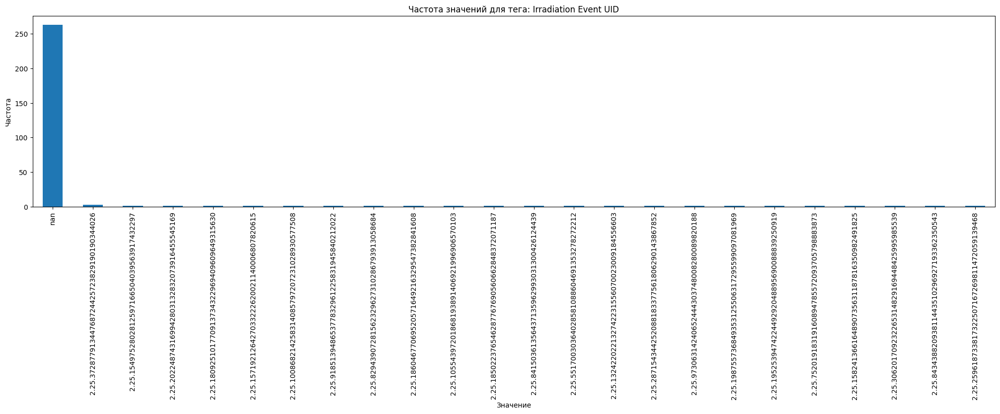

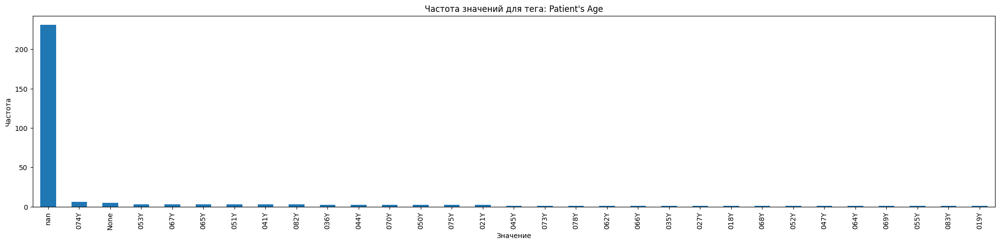

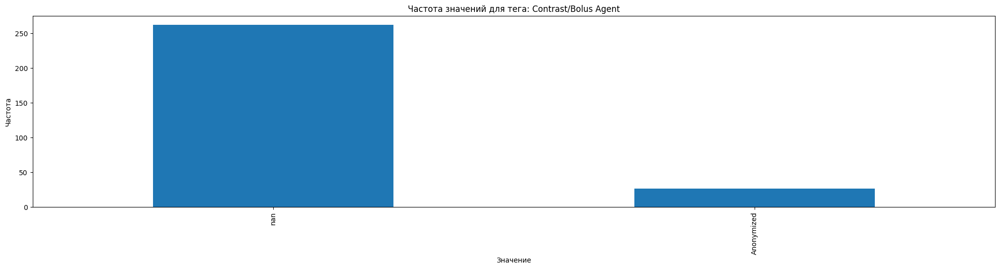

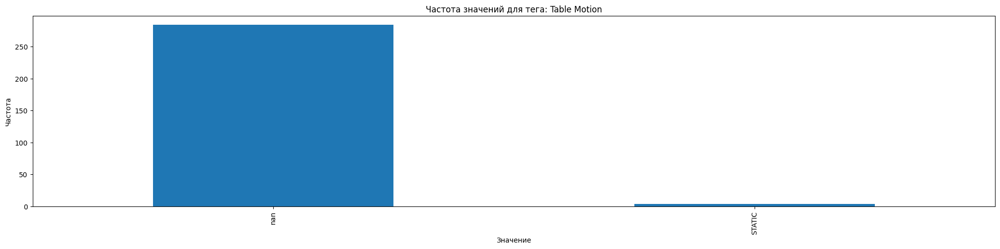

Тег `Table Angle`: каждое значение уникально, график не строится.


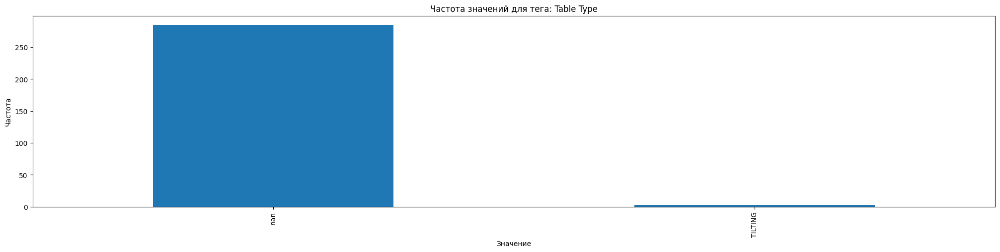

Тег `Average Pulse Width`: каждое значение уникально, график не строится.


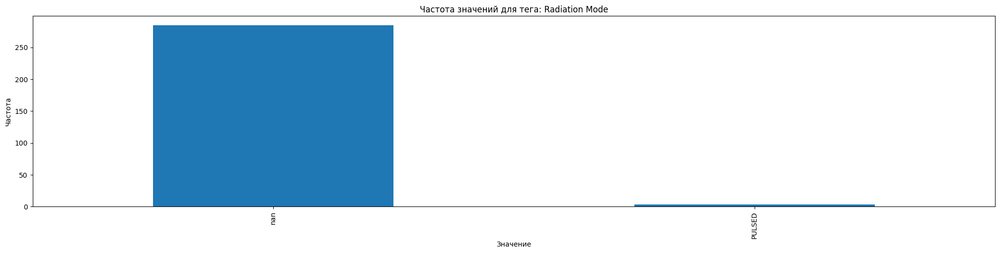

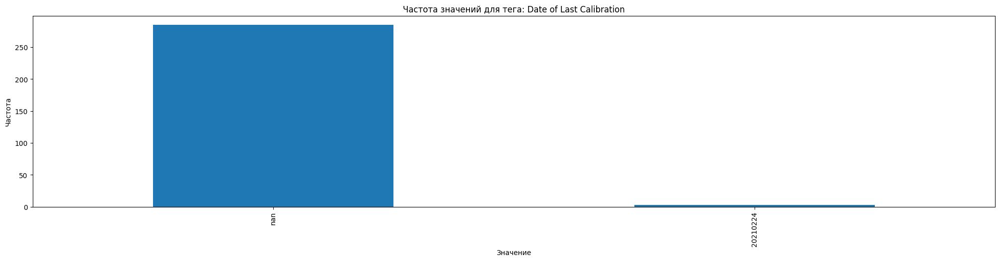

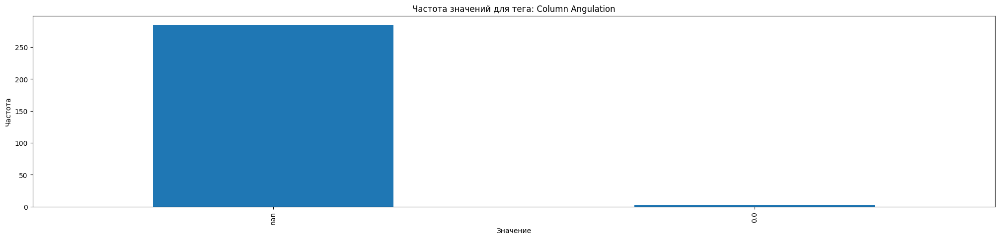

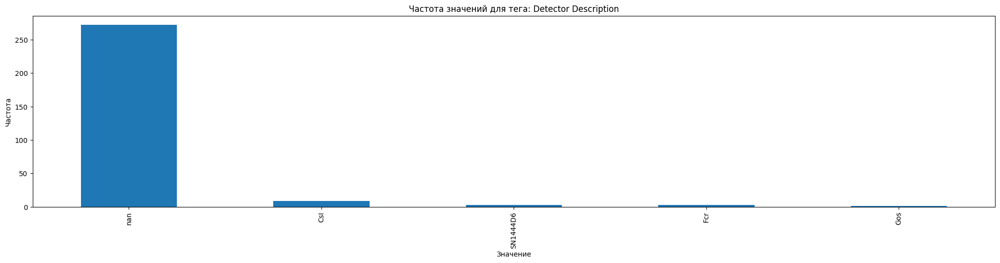

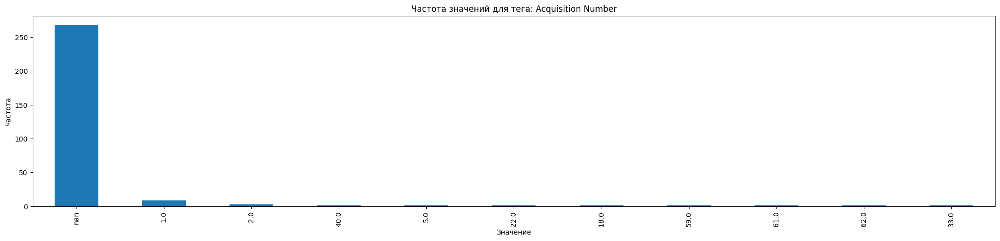

...

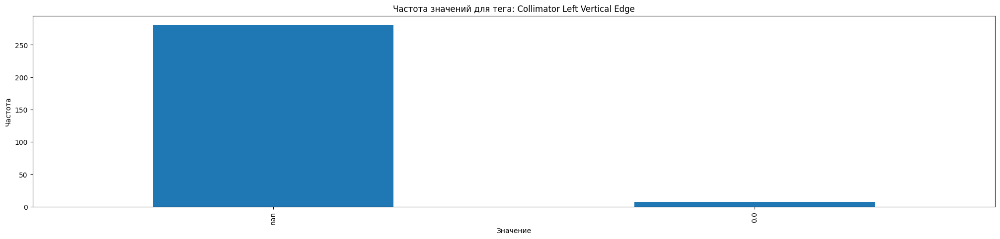

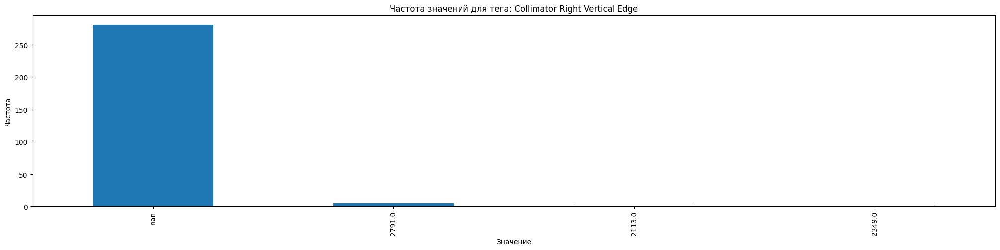

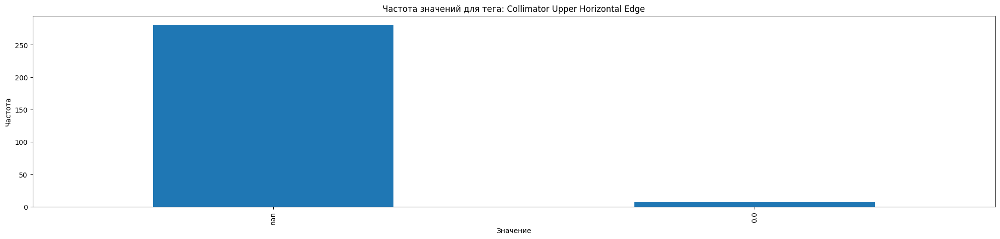

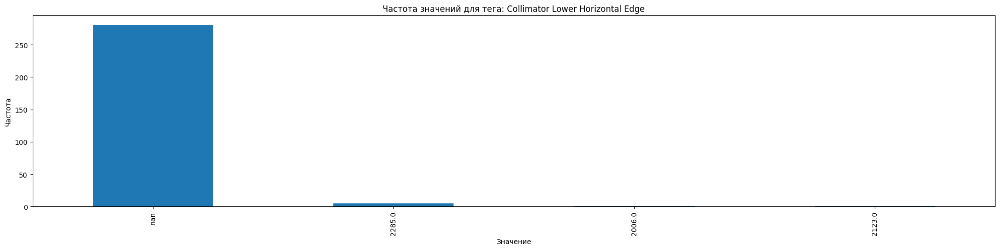

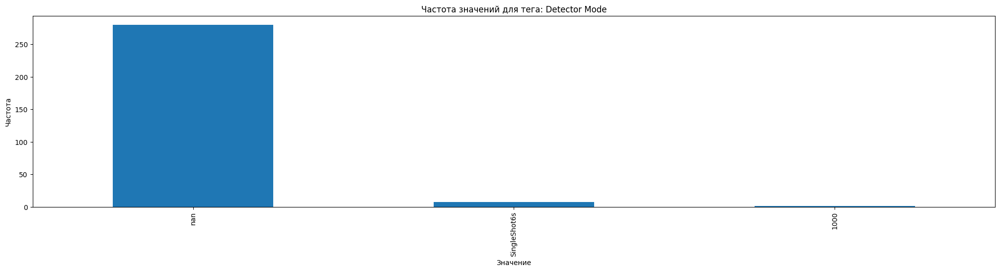

Тег `Detector Time Since Last Exposure`: каждое значение уникально, график не строится.


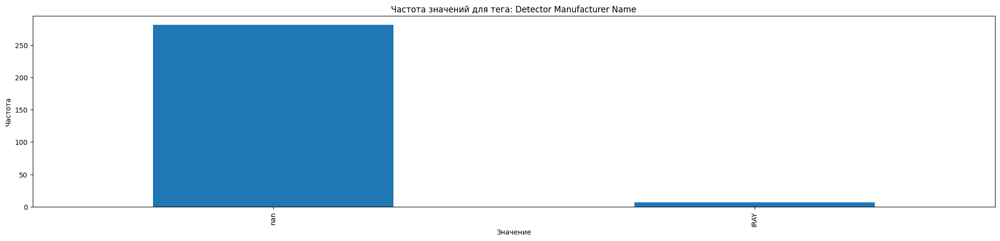

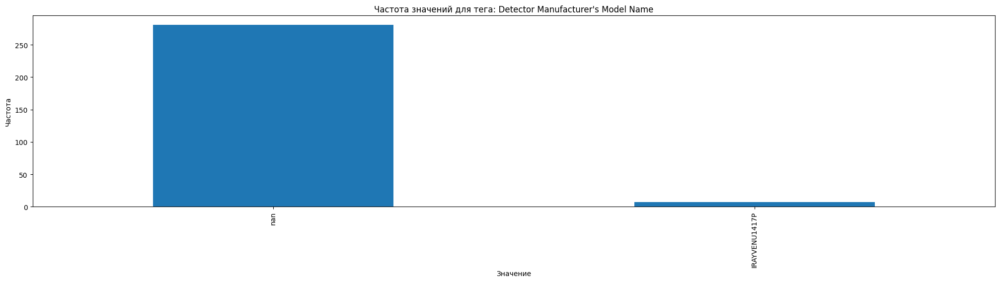

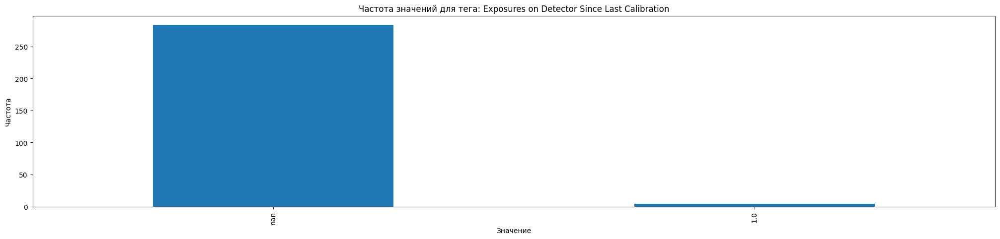

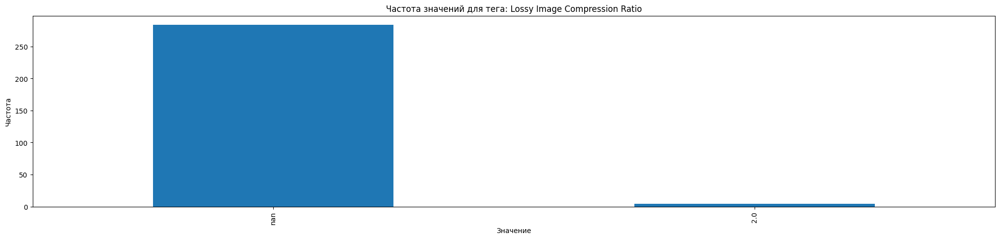

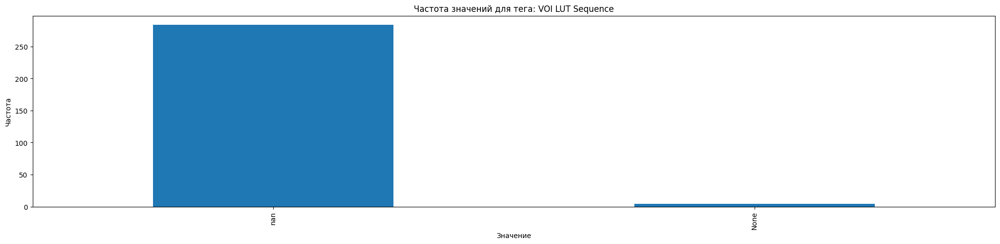

...

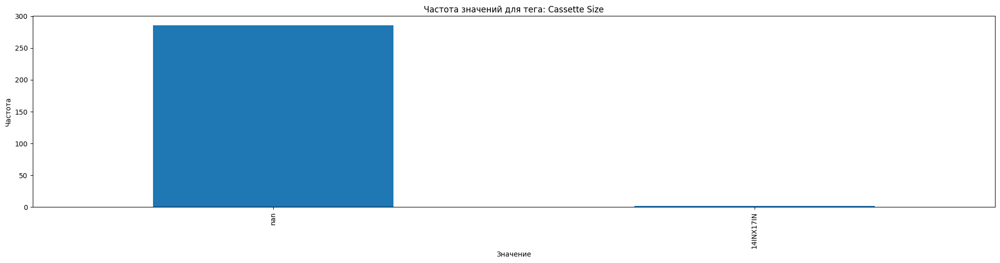

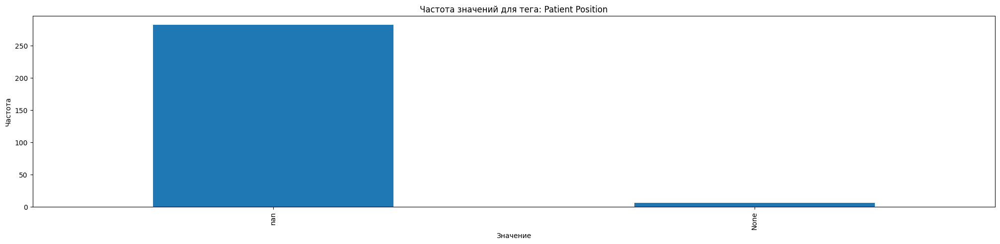

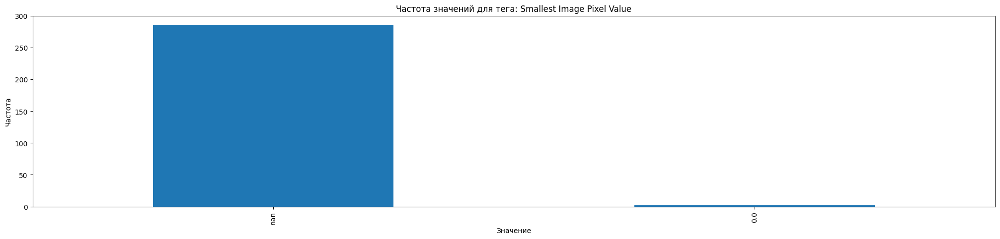

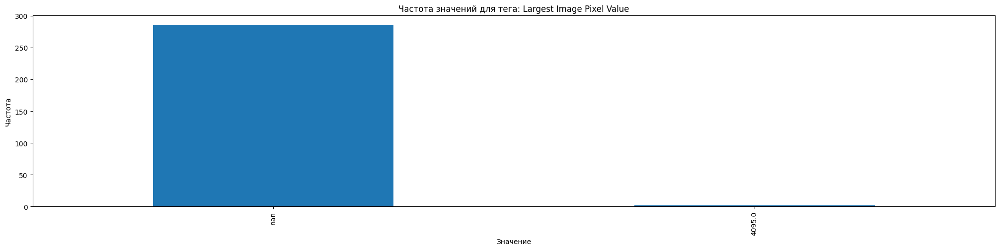

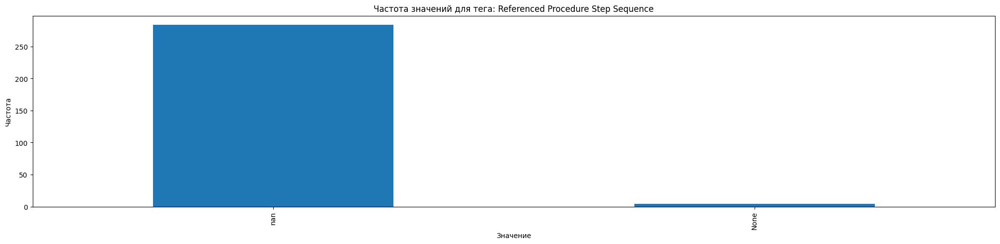

Тег `Intensifier Size`: каждое значение уникально, график не строится.
Тег `Shutter Left Vertical Edge`: каждое значение уникально, график не строится.
Тег `Shutter Right Vertical Edge`: каждое значение уникально, график не строится.
Тег `Shutter Upper Horizontal Edge`: каждое значение уникально, график не строится.
Тег `Shutter Lower Horizontal Edge`: каждое значение уникально, график не строится.


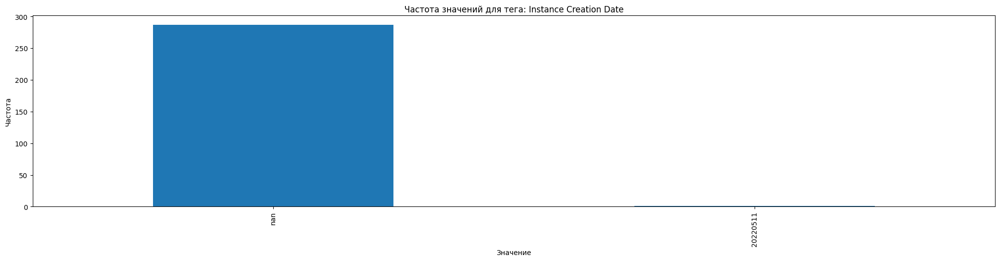

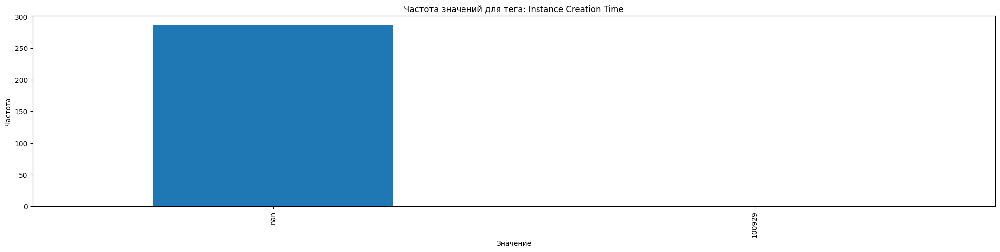

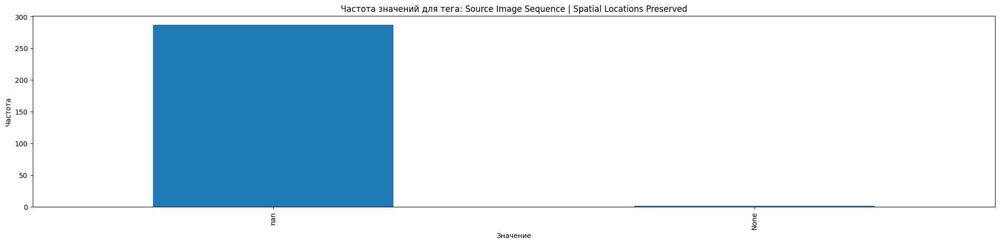

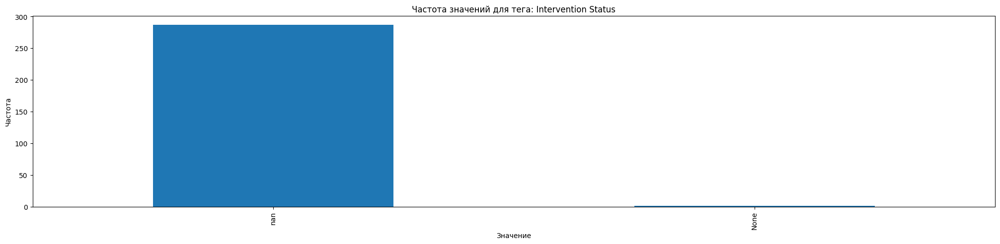

Тег `Positioner Primary Angle`: каждое значение уникально, график не строится.
Тег `Positioner Secondary Angle`: каждое значение уникально, график не строится.
Тег `Detector Primary Angle`: каждое значение уникально, график не строится.
Тег `Detector Secondary Angle`: каждое значение уникально, график не строится.


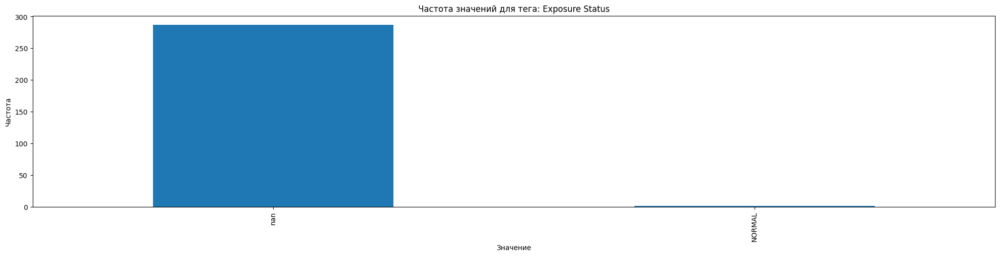

Тег `Phototimer Setting`: каждое значение уникально, график не строится.


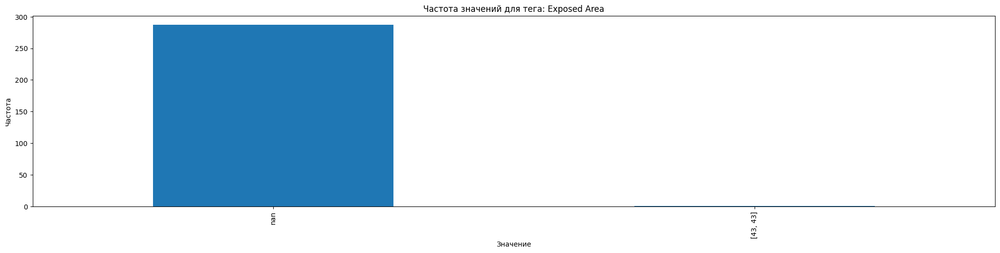

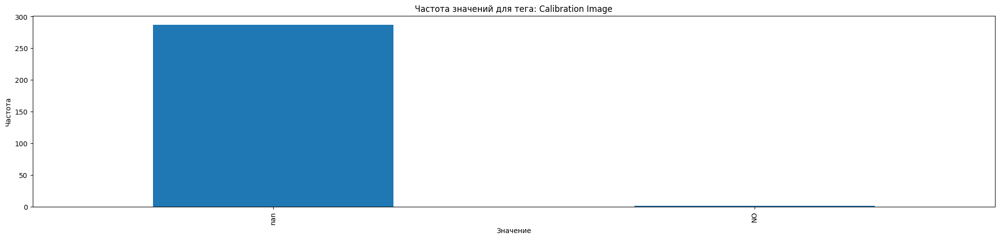

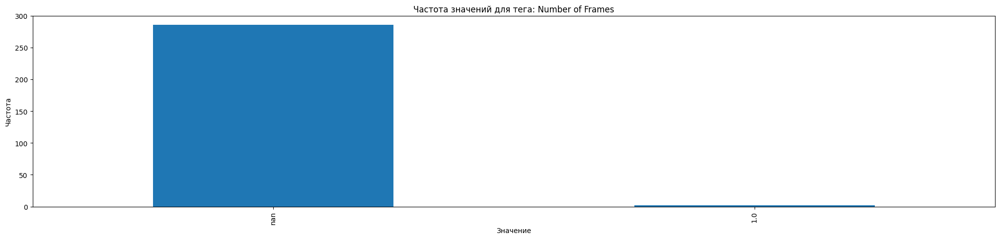

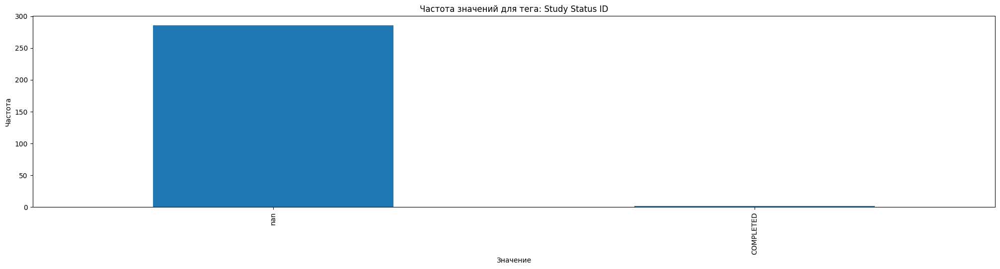

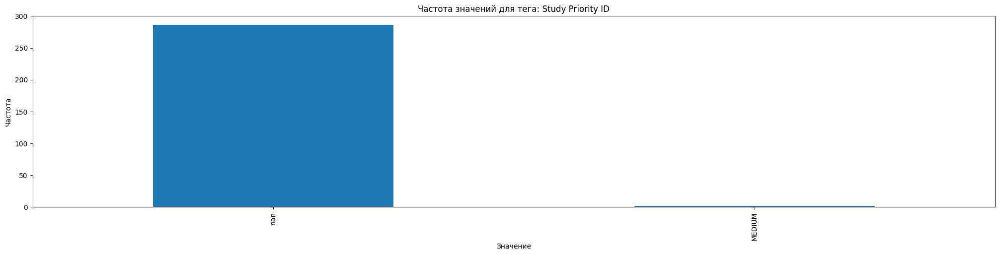

In [10]:
for col in DATA_FRAME.columns:
    value_counts = DATA_FRAME[col].value_counts(dropna=False)
    # Если все значения уникальны (или только NaN не уникальны), не строим график
    non_nan_counts = value_counts.drop(labels=[float('nan')], errors='ignore') if value_counts.index.dtype.kind in 'fc' else value_counts
    if (non_nan_counts == 1).all():
        print(f"Тег `{col}`: каждое значение уникально, график не строится.")
        continue
    plt.figure(figsize=(25, 5))
    value_counts.plot(kind='bar')
    plt.title(f'Частота значений для тега: {col}')
    plt.xlabel('Значение')
    plt.xticks(rotation=90, ha='center')
    plt.ylabel('Частота')
    plt.show()